# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.77'

## Specifying filetype, and folder as before

In [48]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, filetype, prefix, prefix_str, file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [49]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong')
batch='Medium' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [50]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

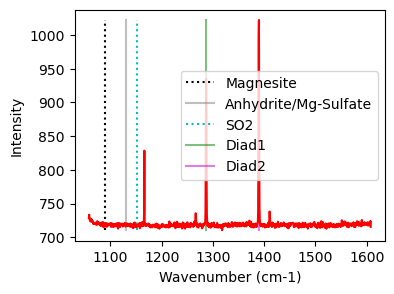

In [51]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [52]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [53]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240), upper_bck_diad1=(1315, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=222.00998863690825, HB_prom=18.617345573550665, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,HB1_Cent,HB1_Area,HB1_Sigma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1286.621137,1286.621187,0.005667,336.956097,0.633352,0,1266.279127,31.286711,0.582067,224.665134,1.748912,0.313428,1.266704,Flagged Warnings:


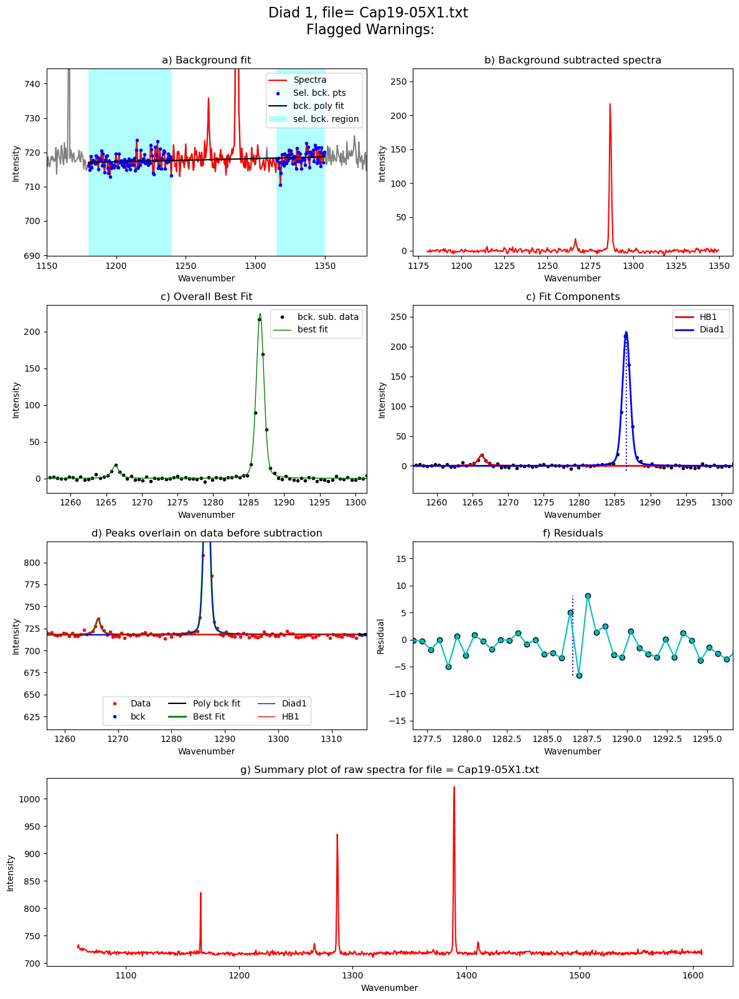

In [54]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [55]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [56]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=1,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=3, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1350), upper_bck_diad2=(1440, 1470), fit_gauss=True, gauss_amp=41.40630793837681, diad_sigma=1, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=325.9289412519447, HB_prom=20.703153969188406, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False, C13_prom=nan)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_Gauss_Cent,Diad2_Gauss_Area,Diad2_Gauss_Sigma,Diad2_refit
0,1389.42678,1389.42683,0.003972,451.756263,0.610377,0,1410.60378,24.618808,0.572566,332.45634,2.076293,0.135683,1.220754,1382.488227,0.414063,15.251378,Flagged Warnings:


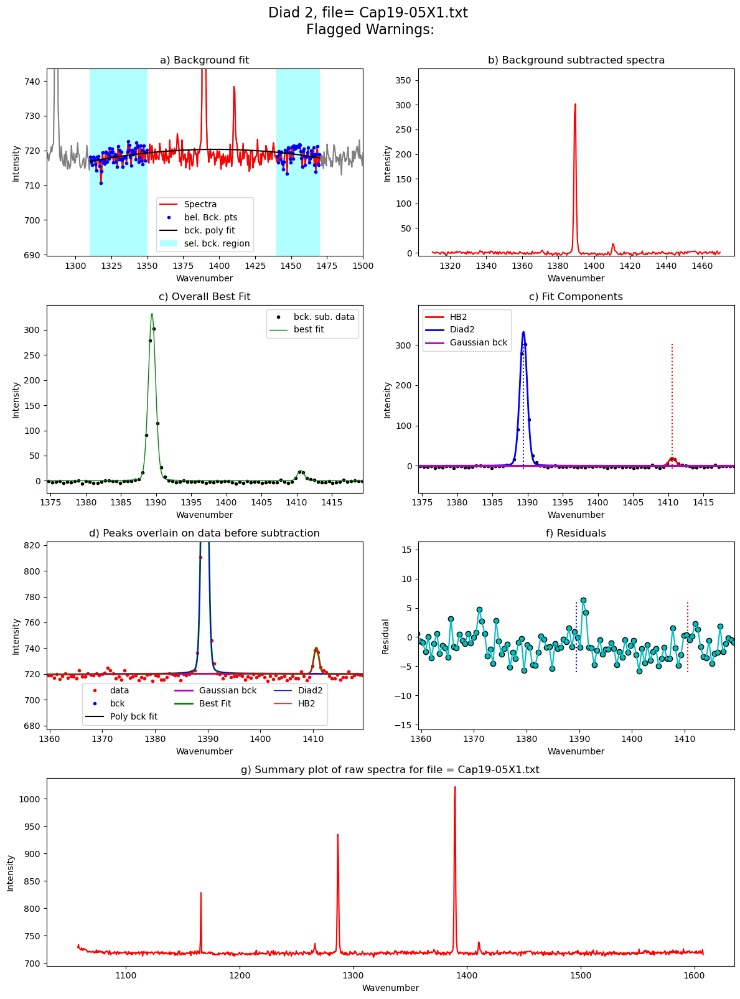

In [57]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/25 [00:00<?, ?it/s]

Processing file: Cap19-05X1.txt


  4%|▍         | 1/25 [00:02<01:06,  2.79s/it]

Processing file: Cap19-06X1.txt


  8%|▊         | 2/25 [00:05<01:03,  2.77s/it]

Processing file: Cap19-06X2.txt


 12%|█▏        | 3/25 [00:09<01:14,  3.37s/it]

Processing file: Cap19-08X1_CRR_DiadFit.txt


 16%|█▌        | 4/25 [00:11<01:01,  2.94s/it]

Processing file: Cap19-08X2.txt


 20%|██        | 5/25 [00:14<00:53,  2.66s/it]

Processing file: Cap19-12X1.txt


 24%|██▍       | 6/25 [00:16<00:48,  2.56s/it]

Processing file: Cap19-12X2.txt


 28%|██▊       | 7/25 [00:20<00:54,  3.02s/it]

Processing file: Cap19-17X1.txt


 32%|███▏      | 8/25 [00:22<00:48,  2.83s/it]

Processing file: Cap19-17X2_CRR_DiadFit.txt


 36%|███▌      | 9/25 [00:31<01:14,  4.67s/it]

Processing file: Cap19-18X1.txt


 40%|████      | 10/25 [00:35<01:05,  4.38s/it]c:\users\penny\onedrive\documents\berkeley_new\diadfit_outer\src\DiadFit\diads.py:2976: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: Cap19-18X2.txt


 44%|████▍     | 11/25 [00:37<00:53,  3.83s/it]

Processing file: FG04_31_MI3.txt


 48%|████▊     | 12/25 [00:40<00:45,  3.46s/it]

Processing file: FG04_31_MI4.txt


 52%|█████▏    | 13/25 [00:43<00:38,  3.22s/it]

Processing file: POC39_CRR_DiadFit.txt


 56%|█████▌    | 14/25 [00:46<00:35,  3.23s/it]

Processing file: POC40_CRR_DiadFit.txt


 60%|██████    | 15/25 [00:49<00:31,  3.14s/it]

Processing file: POC41.txt


 64%|██████▍   | 16/25 [00:51<00:26,  2.99s/it]

Processing file: POC42.txt


 68%|██████▊   | 17/25 [01:05<00:48,  6.10s/it]

Processing file: POC43.txt


 72%|███████▏  | 18/25 [01:07<00:35,  5.04s/it]

Processing file: POC44.txt


 76%|███████▌  | 19/25 [01:10<00:26,  4.34s/it]

Processing file: POC45.txt


 80%|████████  | 20/25 [01:13<00:18,  3.77s/it]

Processing file: POC46.txt


 84%|████████▍ | 21/25 [01:15<00:13,  3.35s/it]

Processing file: POC47.txt


 88%|████████▊ | 22/25 [01:17<00:08,  2.90s/it]

Processing file: POC48.txt


 92%|█████████▏| 23/25 [01:30<00:11,  5.99s/it]

Processing file: POC49.txt


 96%|█████████▌| 24/25 [01:33<00:05,  5.02s/it]

Processing file: POC50.txt


100%|██████████| 25/25 [01:35<00:00,  3.83s/it]


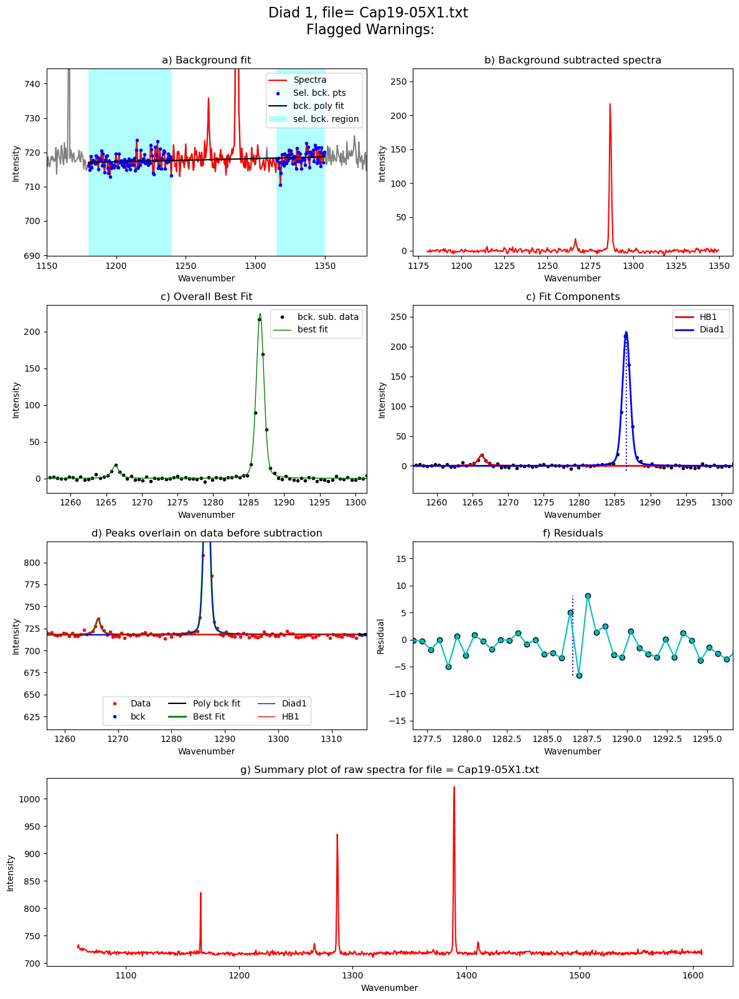

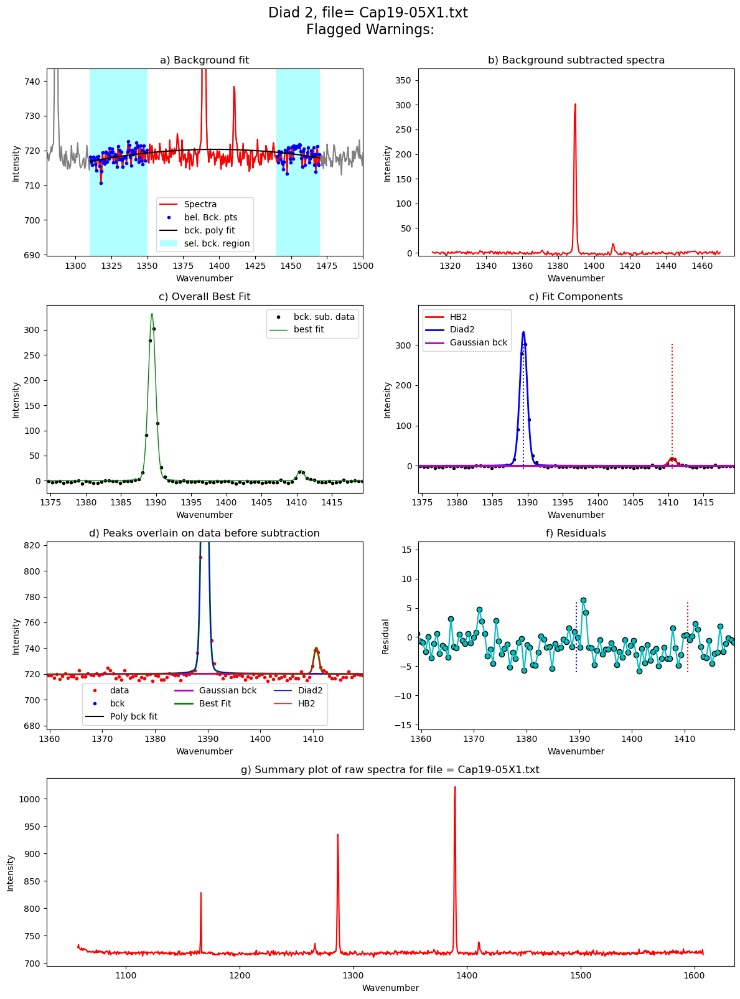

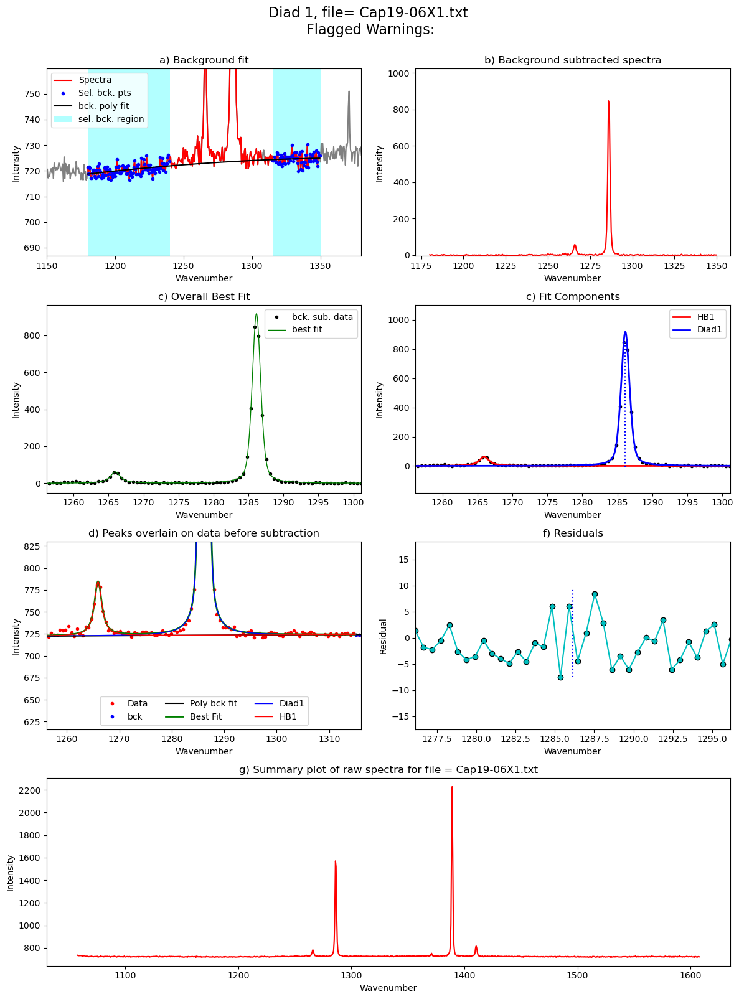

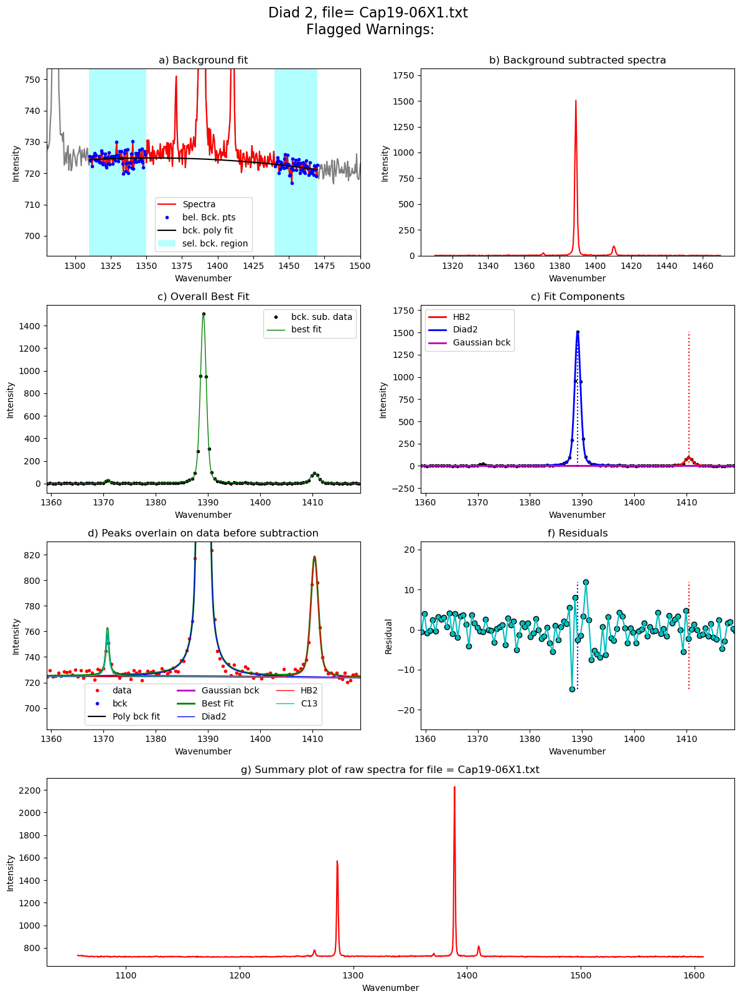

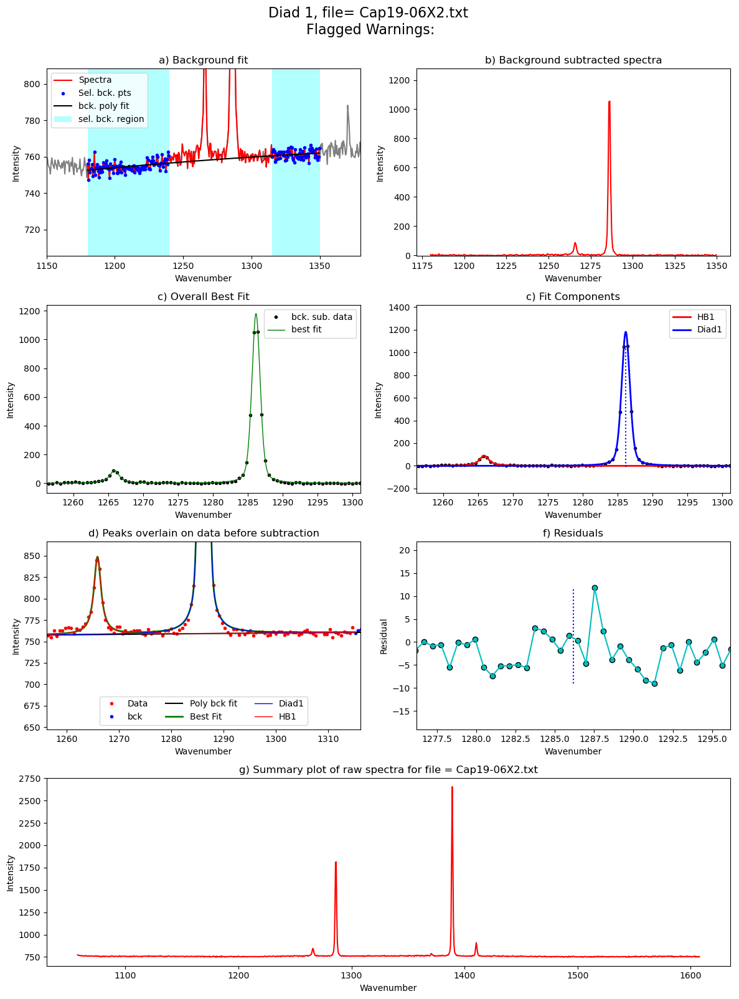

...

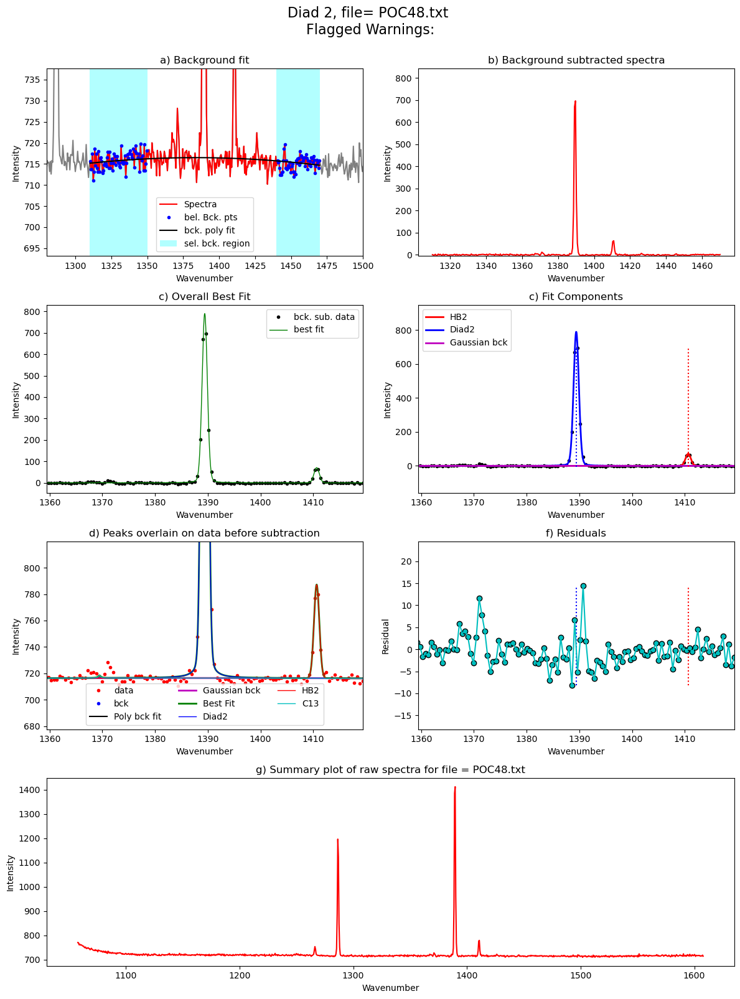

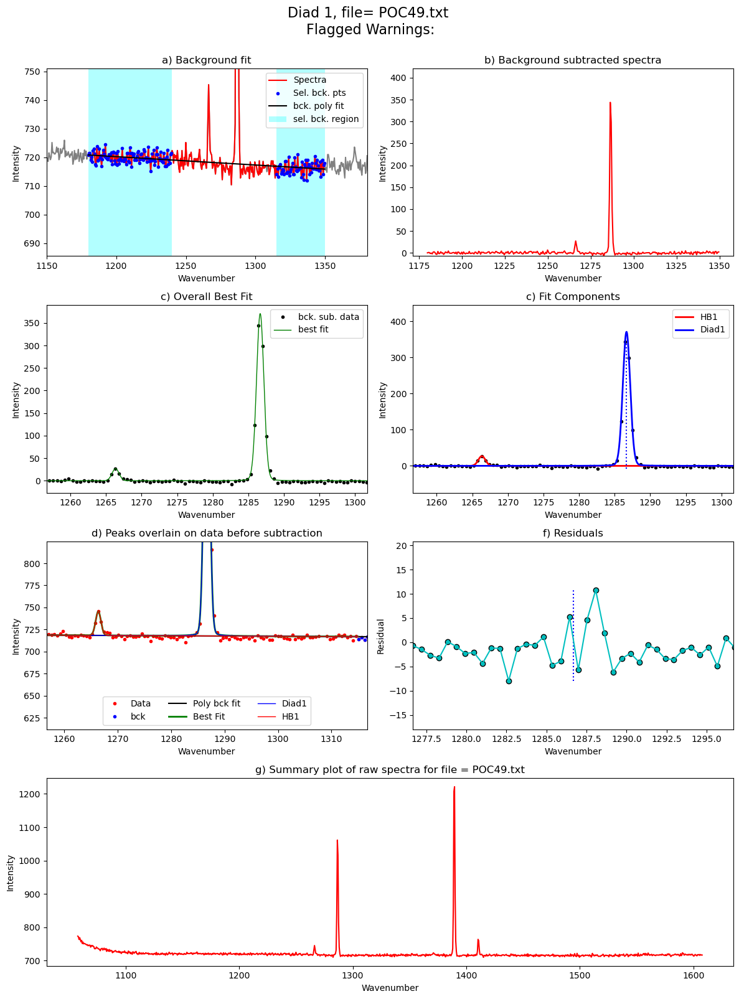

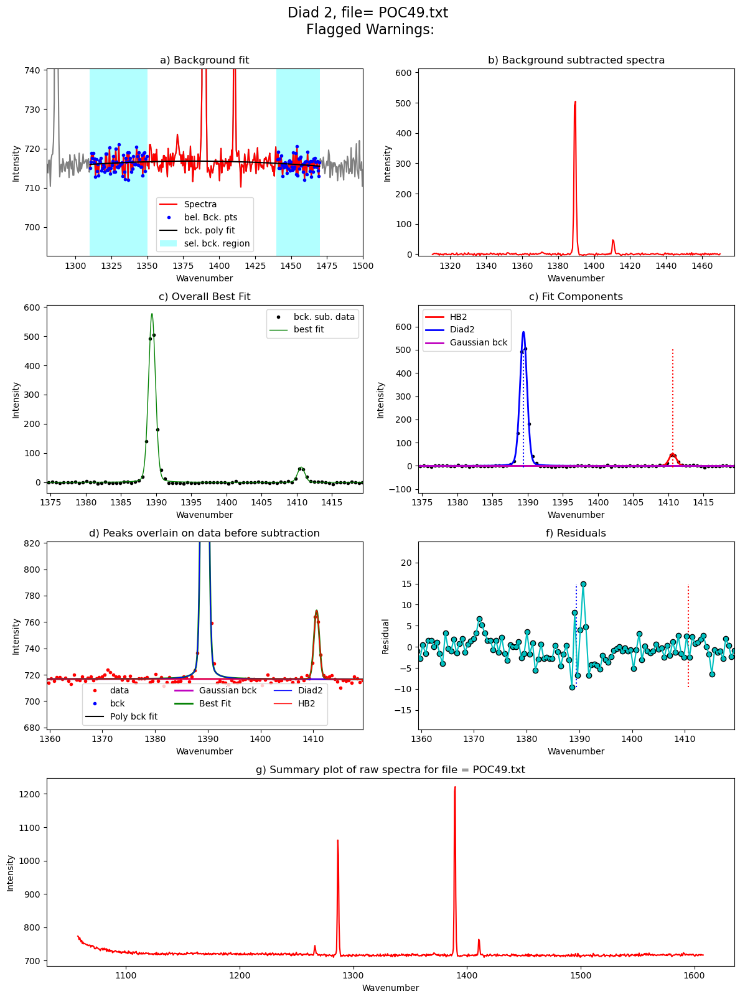

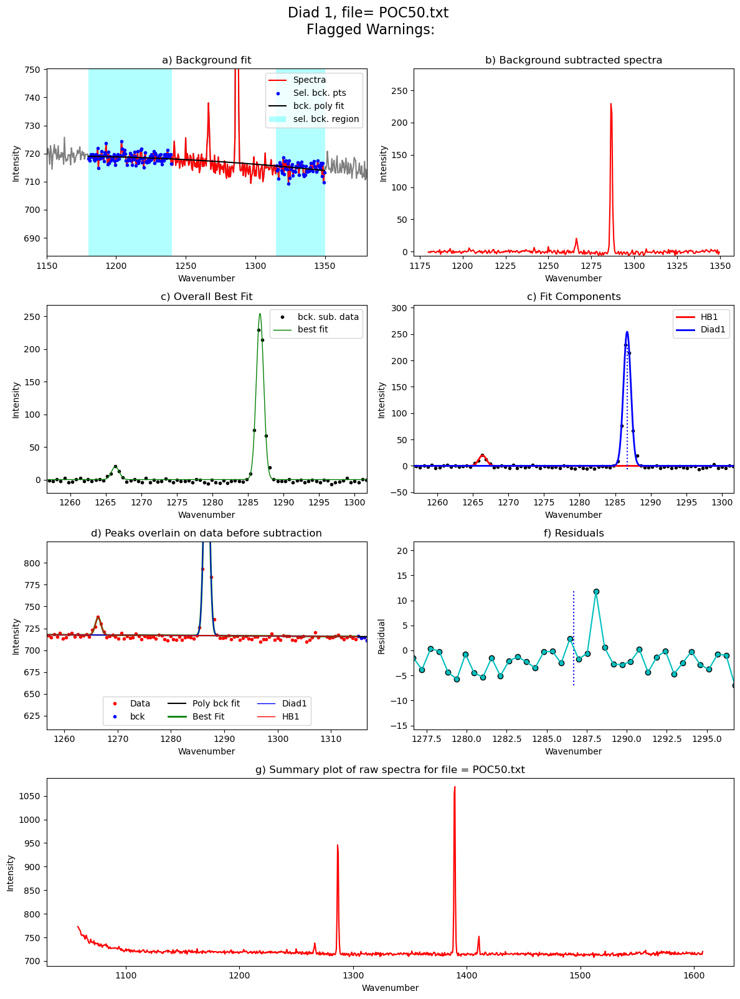

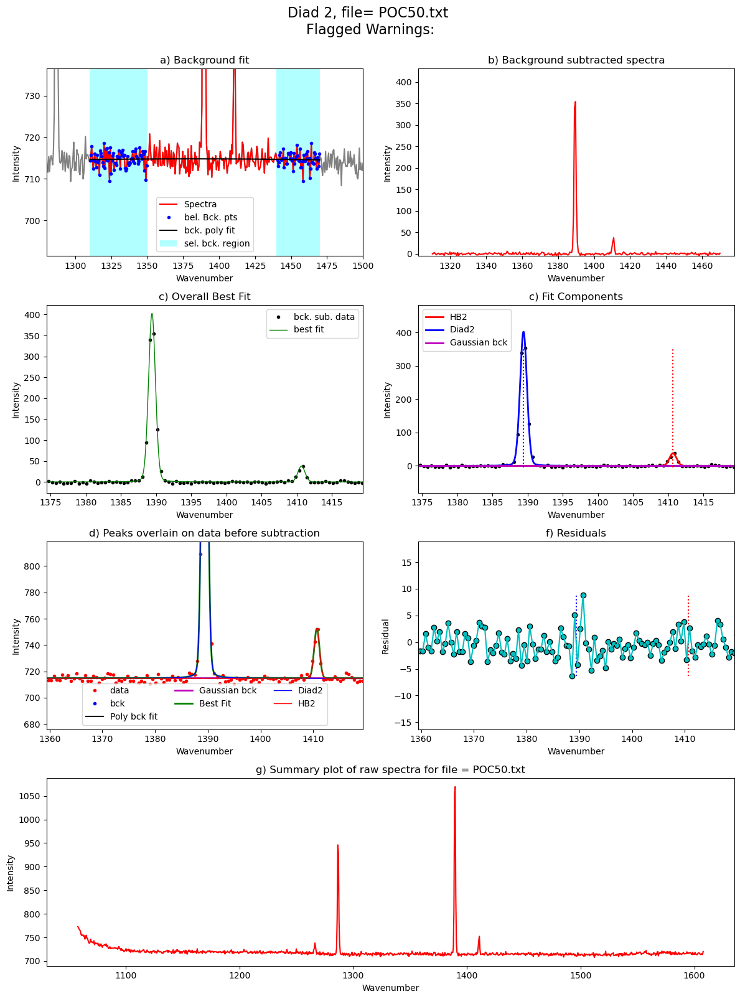

In [58]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [59]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)

In [60]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,HB2_Sigma,C13_Cent,C13_Area,C13_Sigma,Diad2_Gauss_Cent,Diad2_Gauss_Area,Diad2_Gauss_Sigma,Diad1_Gauss_Cent,Diad1_Gauss_Area,Diad1_Gauss_Sigma
0,Cap19-05X1,102.805643,0.006920,1286.621137,0.005667,224.665134,1286.621187,336.956097,0.633352,1.748912,...,0.572566,NaN,NaN,NaN,1382.488227,0.414063,15.251378,NaN,NaN,NaN
1,Cap19-06X1,102.977387,0.002047,1286.142241,0.001752,918.374728,1286.142291,1683.706835,0.722298,2.257990,...,0.857782,1370.776108,38.290276,0.330640,1382.116580,21.925875,16.532020,NaN,NaN,NaN
2,Cap19-06X2,102.941187,0.002026,1286.176065,0.001633,1180.653645,1286.176115,2057.194666,0.702928,2.901559,...,0.744290,1371.186430,33.691904,0.321905,1382.122014,3.075575,16.095247,NaN,NaN,NaN
3,Cap19-08X1_CRR_DiadFit,102.798827,0.005843,1286.534973,0.004717,219.322569,1286.535023,333.836001,0.656139,1.504323,...,0.563294,NaN,NaN,NaN,1382.311281,0.550710,15.420910,NaN,NaN,NaN
4,Cap19-08X2,102.782573,0.007864,1286.576620,0.006578,211.304726,1286.576670,313.109641,0.648191,2.007070,...,0.594846,NaN,NaN,NaN,1387.990346,0.626456,6.008408,NaN,NaN,NaN
5,Cap19-12X1,102.975551,0.002049,1286.103225,0.001715,894.043447,1286.103275,1625.402286,0.733865,2.074143,...,0.787431,1370.788351,29.583274,0.331120,1382.089085,40.641847,16.556043,NaN,NaN,NaN
6,Cap19-12X2,102.947131,0.003608,1286.145921,0.003065,533.561705,1286.145971,954.774292,0.729389,2.080923,...,0.743843,1370.808390,19.791248,0.322414,1382.094584,1.349872,16.120929,NaN,NaN,NaN
7,Cap19-17X1,102.815978,0.006652,1286.343381,0.005516,241.950695,1286.343431,374.411500,0.684947,1.907762,...,0.656801,NaN,NaN,NaN,1382.144796,0.477673,8.317336,NaN,NaN,NaN
8,Cap19-17X2_CRR_DiadFit,102.825322,0.004924,1286.497256,0.004096,444.544038,1286.497306,687.048665,0.664229,2.744738,...,0.616610,1371.313187,23.758008,0.076761,1382.298045,1.159654,15.450610,NaN,NaN,NaN
9,Cap19-18X1,102.883839,0.002777,1286.212036,0.002291,668.507688,1286.212086,1100.540312,0.673146,2.326384,...,0.708143,1370.765341,22.200292,0.314766,1396.084092,1.424987,15.738316,NaN,NaN,NaN


### This plays a sound - if you have a tendency  to procrastinate while notebooks are running

In [61]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()